<h1>Narwals</h1>
<h3>Tres Frisard,

<h1>Imports</h1>

In [ ]:
  import pandas as pd
  import numpy as np
  import matplotlib.pyplot as plt
  from pandas.plotting import scatter_matrix

<h1>Reading the data</h1>

In [ ]:
file_name = "high_diamond_ranked_10min.csv"
Diamond = pd.read_csv(file_name)
Diamond

,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalGold,blueAvgLevel,blueTotalExperience,blueTotalMinionsKilled,blueTotalJungleMinionsKilled,blueGoldDiff,blueExperienceDiff,blueCSPerMin,blueGoldPerMin,redWardsPlaced,redWardsDestroyed,redFirstBlood,redKills,redDeaths,redAssists,redEliteMonsters,redDragons,redHeralds,redTowersDestroyed,redTotalGold,redAvgLevel,redTotalExperience,redTotalMinionsKilled,redTotalJungleMinionsKilled,redGoldDiff,redExperienceDiff,redCSPerMin,redGoldPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,0,0,17210,6.6,17039,195,36,643,-8,19.5,1721.0,15,6,0,6,9,8,0,0,0,0,16567,6.8,17047,197,55,-643,8,19.7,1656.7
1,4523371949,0,12,1,0,5,5,5,0,0,0,0,14712,6.6,16265,174,43,-2908,-1173,17.4,1471.2,12,1,1,5,5,2,2,1,1,1,17620,6.8,17438,240,52,2908,1173,24.0,1762.0
2,4521474530,0,15,0,0,7,11,4,1,1,0,0,16113,6.4,16221,186,46,-1172,-1033,18.6,1611.3,15,3,1,11,7,14,0,0,0,0,17285,6.8,17254,203,28,1172,1033,20.3,1728.5
3,4524384067,0,43,1,0,4,5,5,1,0,1,0,15157,7.0,17954,201,55,-1321,-7,20.1,1515.7,15,2,1,5,4,10,0,0,0,0,16478,7.0,17961,235,47,1321,7,23.5,1647.8
4,4436033771,0,75,4,0,6,6,6,0,0,0,0,16400,7.0,18543,210,57,-1004,230,21.0,1640.0,17,2,1,6,6,7,1,1,0,0,17404,7.0,18313,225,67,1004,-230,22.5,1740.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9874,4527873286,1,17,2,1,7,4,5,1,1,0,0,17765,7.2,18967,211,69,2519,2469,21.1,1776.5,46,3,0,4,7,7,0,0,0,0,15246,6.8,16498,229,34,-2519,-2469,22.9,1524.6
9875,4527797466,1,54,0,0,6,4,8,1,1,0,0,16238,7.2,19255,233,48,782,888,23.3,1623.8,12,21,1,4,6,3,0,0,0,0,15456,7.0,18367,206,56,-782,-888,20.6,1545.6
9876,4527713716,0,23,1,0,6,7,5,0,0,0,0,15903,7.0,18032,210,45,-2416,-1877,21.0,1590.3,14,0,1,7,6,11,1,1,0,0,18319,7.4,19909,261,60,2416,1877,26.1,1831.9
9877,4527628313,0,14,4,1,2,3,3,1,1,0,0,14459,6.6,17229,224,48,-839,-1085,22.4,1445.9,66,4,0,3,2,1,0,0,0,0,15298,7.2,18314,247,40,839,1085,24.7,1529.8


<h1>Cleaning</h1>

Unclean data in the machine will only hold it back so we need to remove things that may be repeated more than once for example blue gold differential and red goald differenal. They are just opposites and its double counting.Another example of double counting would be a red kills and blue deaths they are the same.

In [ ]:
Dropped_columns=["blueTotalGold","blueAvgLevel","blueTotalExperience","blueGoldPerMin","redFirstBlood","redKills","redDeaths","redTotalGold","redAvgLevel","redTotalExperience","blueTotalJungleMinionsKilled","redTotalJungleMinionsKilled","redGoldDiff","redExperienceDiff","redGoldPerMin"]

In [ ]:
def Cleaner(dataframe, dropped):
  """
  Input(dataframe) any dataframe
  Input(dropped) a list of all the columns wanted dropped
  Output the same data frame with all the columns dropped
  """
  return dataframe.drop(dropped, axis =1, inplace=True)

In [ ]:
Cleaner(Diamond,Dropped_columns)

In [ ]:
Diamond


,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalMinionsKilled,blueGoldDiff,blueExperienceDiff,blueCSPerMin,redWardsPlaced,redWardsDestroyed,redAssists,redEliteMonsters,redDragons,redHeralds,redTowersDestroyed,redTotalMinionsKilled,redCSPerMin
0,4519157822,0,28,2,1,9,6,11,0,0,0,0,195,643,-8,19.5,15,6,8,0,0,0,0,197,19.7
1,4523371949,0,12,1,0,5,5,5,0,0,0,0,174,-2908,-1173,17.4,12,1,2,2,1,1,1,240,24.0
2,4521474530,0,15,0,0,7,11,4,1,1,0,0,186,-1172,-1033,18.6,15,3,14,0,0,0,0,203,20.3
3,4524384067,0,43,1,0,4,5,5,1,0,1,0,201,-1321,-7,20.1,15,2,10,0,0,0,0,235,23.5
4,4436033771,0,75,4,0,6,6,6,0,0,0,0,210,-1004,230,21.0,17,2,7,1,1,0,0,225,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9874,4527873286,1,17,2,1,7,4,5,1,1,0,0,211,2519,2469,21.1,46,3,7,0,0,0,0,229,22.9
9875,4527797466,1,54,0,0,6,4,8,1,1,0,0,233,782,888,23.3,12,21,3,0,0,0,0,206,20.6
9876,4527713716,0,23,1,0,6,7,5,0,0,0,0,210,-2416,-1877,21.0,14,0,11,1,1,0,0,261,26.1
9877,4527628313,0,14,4,1,2,3,3,1,1,0,0,224,-839,-1085,22.4,66,4,1,0,0,0,0,247,24.7


Remove any empty data

<h1>Training and Test</h1>

Next we ant to split our data up into a training and test data set so we can have a way of checking ourselves and not overfitting our model.

In [ ]:
Test=Diamond.sample(frac=.2).reset_index()
Test

,index,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalMinionsKilled,blueGoldDiff,blueExperienceDiff,blueCSPerMin,redWardsPlaced,redWardsDestroyed,redAssists,redEliteMonsters,redDragons,redHeralds,redTowersDestroyed,redTotalMinionsKilled,redCSPerMin
0,912,4524732459,0,19,3,1,7,9,10,0,0,0,0,209,-462,-1186,20.9,18,5,9,0,0,0,0,213,21.3
1,2486,4519842459,1,15,3,1,11,4,15,0,0,0,0,228,3857,2660,22.8,19,2,6,1,1,0,0,210,21.0
2,3889,4456819413,0,29,3,0,5,7,8,0,0,0,0,184,-1044,-487,18.4,18,2,11,1,1,0,0,226,22.6
3,2665,4429490822,1,17,4,0,11,9,12,1,1,0,0,221,1139,1170,22.1,14,0,9,0,0,0,0,218,21.8
4,985,4522599677,0,17,1,1,4,1,4,1,1,0,0,232,1423,1022,23.2,14,5,1,1,0,1,0,242,24.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1971,3905,4521611697,1,34,3,1,9,8,6,0,0,0,0,233,1068,1295,23.3,14,4,10,0,0,0,0,200,20.0
1972,3857,4477637530,0,39,0,1,2,9,3,1,0,1,0,198,-3421,-2978,19.8,16,3,10,1,1,0,0,238,23.8
1973,8947,4526195389,1,18,3,1,4,6,2,1,0,1,0,218,-1006,-1606,21.8,45,3,5,1,1,0,0,221,22.1
1974,272,4515353277,1,18,3,1,6,10,8,0,0,0,0,201,-1334,-1607,20.1,14,4,12,1,1,0,0,198,19.8


In [ ]:
Train=Diamond.drop(Test.index).reset_index()
Train

,index,gameId,blueWins,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalMinionsKilled,blueGoldDiff,blueExperienceDiff,blueCSPerMin,redWardsPlaced,redWardsDestroyed,redAssists,redEliteMonsters,redDragons,redHeralds,redTowersDestroyed,redTotalMinionsKilled,redCSPerMin
0,1976,4524973886,0,55,5,1,2,5,4,1,1,0,0,226,-1488,-572,22.6,18,4,6,0,0,0,0,234,23.4
1,1977,4491667305,0,16,1,1,6,6,4,0,0,0,0,245,848,129,24.5,12,2,8,0,0,0,0,192,19.2
2,1978,4523353558,0,14,3,0,1,7,0,0,0,0,0,202,-5800,-3960,20.2,12,1,15,1,1,0,1,245,24.5
3,1979,4523617002,0,13,1,0,11,11,13,0,0,0,0,213,981,42,21.3,14,1,13,1,1,0,0,197,19.7
4,1980,4495172463,1,12,0,0,4,6,5,0,0,0,0,170,-2642,-1908,17.0,16,2,7,1,1,0,0,258,25.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7898,9874,4527873286,1,17,2,1,7,4,5,1,1,0,0,211,2519,2469,21.1,46,3,7,0,0,0,0,229,22.9
7899,9875,4527797466,1,54,0,0,6,4,8,1,1,0,0,233,782,888,23.3,12,21,3,0,0,0,0,206,20.6
7900,9876,4527713716,0,23,1,0,6,7,5,0,0,0,0,210,-2416,-1877,21.0,14,0,11,1,1,0,0,261,26.1
7901,9877,4527628313,0,14,4,1,2,3,3,1,1,0,0,224,-839,-1085,22.4,66,4,1,0,0,0,0,247,24.7


<h1>Visualizing our data</h1>

We need to visualize our data so we can see which variables give us good seperation and will be good for using our algorithm

In [ ]:
from pandas.plotting import scatter_matrix
Train =Train.rename(columns={"gameId":"ID", "blueWins":"Classifier"})
Test =Test.rename(columns={"gameId":"ID", "blueWins":"Classifier"})

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f246e63c7d0>,
      dtype=object)

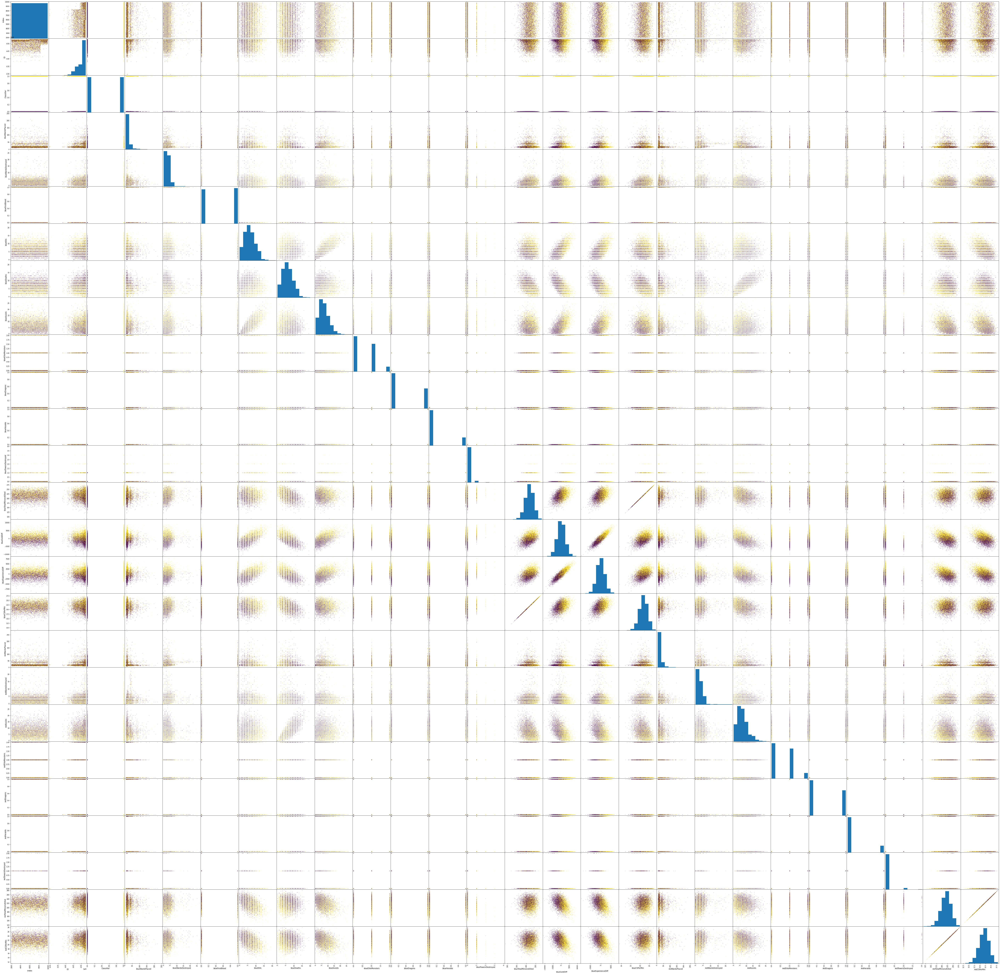

In [ ]:
scatter_matrix(Train, alpha=0.2, figsize=(100, 100),c=Train["Classifier"], CMap="gray")

<h1>Further Cleaning our data</h1>

For a good algorithm we want to make sure our variables sperate out the wins and losses

In [ ]:
Further_cleaning=["blueWardsPlaced", "blueWardsDestroyed", "blueFirstBlood","blueEliteMonsters","blueDragons", "blueHeralds", "blueTowersDestroyed","blueTotalMinionsKilled","blueCSPerMin", "redWardsPlaced", "redWardsDestroyed","redEliteMonsters", "redDragons", "redHeralds", "redTowersDestroyed", "redTotalMinionsKilled", "redCSPerMin"]

In [ ]:
Cleaner(Train,Further_cleaning)
Cleaner(Test, Further_cleaning)

In [ ]:
Train

,index,gameId,blueWins,blueKills,blueDeaths,blueAssists,blueGoldDiff,blueExperienceDiff,redAssists
0,1976,4524973886,0,2,5,4,-1488,-572,6
1,1977,4491667305,0,6,6,4,848,129,8
2,1978,4523353558,0,1,7,0,-5800,-3960,15
3,1979,4523617002,0,11,11,13,981,42,13
4,1980,4495172463,1,4,6,5,-2642,-1908,7
...,...,...,...,...,...,...,...,...,...
7898,9874,4527873286,1,7,4,5,2519,2469,7
7899,9875,4527797466,1,6,4,8,782,888,3
7900,9876,4527713716,0,6,7,5,-2416,-1877,11
7901,9877,4527628313,0,2,3,3,-839,-1085,1


In [ ]:
Test

,index,ID,Classifier,blueKills,blueDeaths,blueAssists,blueGoldDiff,blueExperienceDiff,redAssists
0,9782,4505511340,0,10,9,10,-1272,-1634,9
1,3309,4501834987,1,5,4,5,859,128,5
2,1409,4490472819,0,8,8,5,-507,-790,9
3,2620,4520789246,0,5,10,5,-4229,-4184,12
4,4831,4522612481,0,7,5,7,482,-670,2
...,...,...,...,...,...,...,...,...,...
1971,5353,4521076774,1,15,4,17,6375,3949,5
1972,9541,4501146183,0,4,4,2,20,-1382,3
1973,4016,4523838498,1,4,8,4,-2861,-2348,12
1974,6575,4526009569,0,1,9,3,-4492,-4085,8


<h1>Classifying our data</h1>
Now that we have finished setting up our data we can start classifying our data


Defining the functions:

In [ ]:
def Cleaner(dataframe, dropped):
  """
  Input(dataframe) any dataframe
  Input(dropped) a list of all the columns wanted dropped
  Output the same data frame with all the columns dropped
  """
  return dataframe.drop(dropped, axis =1, inplace=True)
def row_to_array(row):
 """
 input(row): any row of a dataframe
 output(list) a list with each value the corresponding to a column in the row
 """
 array= []
 for i in row.columns.values:
   array = np.append(array, row.at[row.index[0],i])
 return array
def distance(array_1, array_2):
  """
  input(array_1): a list of values
  input(array_2): a list of values
  output(int) : the distance between the values
  make sure its the same length
  """
  return np.sqrt(sum((array_1-array_2)**2))
def Classify(row, table, k):
  """
  input(row): a the row of a dataframe (testing data)
  input(table): a table of training data 
  input(k): an int that will be how many nearest neighbors we are tracing
  output(): outputs the row of a table with a new predition column
  """
  array_2= row_to_array(row)[2:]
  distances= []
  copy_table=table.copy()
  for i in range(table.shape[0]):
     array_1=row_to_array(table.loc[i:i])[2:]
     distances= np.append(distances,distance(array_1, array_2))
  copy_table["Distances"]= distances
  y=copy_table.sort_values(by=["Distances"], ascending=True).reset_index()[0:k]
  if sum(y["Classifier"])>(k/2):
    return 1
  else:
    return 0
def Get_accuracy(test_table, train_table, k):
  """
  input(test_table): a table of test values
  input(train_table): a table of training data
  input(k): an int that will be how many nearest neighbors we are tracing
  output(int): the accuracy as a percentage of how correct the model is
  """
  copy_test=test_table.copy()
  results=[]
  if test_table.shape[0]>100:
    copy_test=copy_test[0:100]
  for i in range(copy_test.shape[0]):
     results = np.append(results, Classify(copy_test.loc[i:i], train_table, k))
  copy_test["Prediction"]= results  
  counter = 0
  for  i in range(copy_test.shape[0]):
    if copy_test.at[i,"Classifier"]==copy_test.at[i,"Prediction"]:
      counter= counter+1
  return counter/len(copy_test)

In [ ]:
print(Classify(Test.loc[2:2], Train, 3))
Test.loc[2:2]

1


,index,ID,Classifier,blueWardsPlaced,blueWardsDestroyed,blueFirstBlood,blueKills,blueDeaths,blueAssists,blueEliteMonsters,blueDragons,blueHeralds,blueTowersDestroyed,blueTotalMinionsKilled,blueGoldDiff,blueExperienceDiff,blueCSPerMin,redWardsPlaced,redWardsDestroyed,redAssists,redEliteMonsters,redDragons,redHeralds,redTowersDestroyed,redTotalMinionsKilled,redCSPerMin
2,8023,4505416038,0,56,1,1,2,1,4,0,0,0,0,258,1684,1773,25.8,16,3,1,0,0,0,0,212,21.2


In [ ]:
Get_accuracy(Test,Train, 5)

0.77

In [ ]:
def main():
  """
  input():none
  Output():the accuracy of the model
  """
  file_name = input("What dataset(csv) do you want to use? ")
  all_data=pd.read_csv(file_name)
  print(all_data)
  excess_colums=[]
  name=""
  print(all_data.columns.values)
  while name != "cancel":
    name=input("Name of the extra column?(cancel if done removing excess data, undo if you made a spelling mistake)")
    if name == "cancel":
      continue
    elif name == "undo":
      excess_colums = excess_colums[:-1]
    else:
      excess_colums=np.append(excess_colums, name)
  Cleaner(all_data,excess_colums)
  classifier_column=input("What is the classifier column name")
  ID_question=input("Does your dataset have a unique ID column? Y or N")
  if ID_question =="Y":
    ID_column= input("What is the name of the ID column")
    all_data = all_data.rename(columns={ID_column:"ID"})
  elif ID_question == "N":
    counter=0
    ID_column=[]
    for i in range(all_data.shape[0]):
      ID_column= np.append(ID_column, counter)
      counter= counter+1
    all_data["ID"]= ID_column
  else:
      ID_question=input("Does your dataset have a unique ID column? Y or N")
  all_data = all_data.rename(columns={classifier_column:"Classifier"})
  first_column=all_data.pop("Classifier")
  second_column=all_data.pop("ID")
  all_data.insert(0,"Classifier", first_column)
  all_data.insert(0,"ID", second_column)  
  percentage =float(input("What percentage of data do you want to set aside for testin input a decimal"))
  Test=all_data.sample(frac=percentage)
  Train=all_data.drop(Test.index).reset_index()
  Test=Test.reset_index()
  scatter_matrix(Train, alpha=100.0, figsize=(100, 100),c=Train["Classifier"], CMap="gray")
  plt.show()
  plt.pause(1)
  Useless_colums2=[]
  name2=""
  print(Train.columns.values)
  while name2 != "cancel":
    name2=input("Name of the extra columns that dont show good seperation of data?(cancel if done removing excess data)")
    if name2 == "cancel":
      continue
    elif name == "undo":
      Useless_colums2 = Useless_colums2[:-1]
    else:
      Useless_colums2=np.append(Useless_colums2, name2)
  Cleaner(Train,Useless_colums2)
  Cleaner(Test,Useless_colums2)
  k=int(input("To how many nearest neightbors do you want to trace we reccomend prime numbers?"))
  return Get_accuracy(Test,Train,k)

What dataset(csv) do you want to use? classification.csv
           age   interest  success
0    23.657801  18.859917      0.0
1    22.573729  17.969223      0.0
2    32.553424  29.463651      0.0
3     6.718035  25.704665      1.0
4    14.401919  16.770856      0.0
..         ...        ...      ...
292  27.697220  18.799309      0.0
293  15.150959  72.000352      1.0
294  22.264378  68.453459      1.0
295  25.677420  90.118212      1.0
296  21.215594  48.265520      1.0

[297 rows x 3 columns]
['age' 'interest' 'success']
Name of the extra column?(cancel if done removing excess data, undo if you made a spelling mistake)gfd
Name of the extra column?(cancel if done removing excess data, undo if you made a spelling mistake)undo
Name of the extra column?(cancel if done removing excess data, undo if you made a spelling mistake)cancel
What is the classifier column namesuccess
Does your dataset have a unique ID column? Y or NN
What percentage of data do you want to set aside for testin inpu

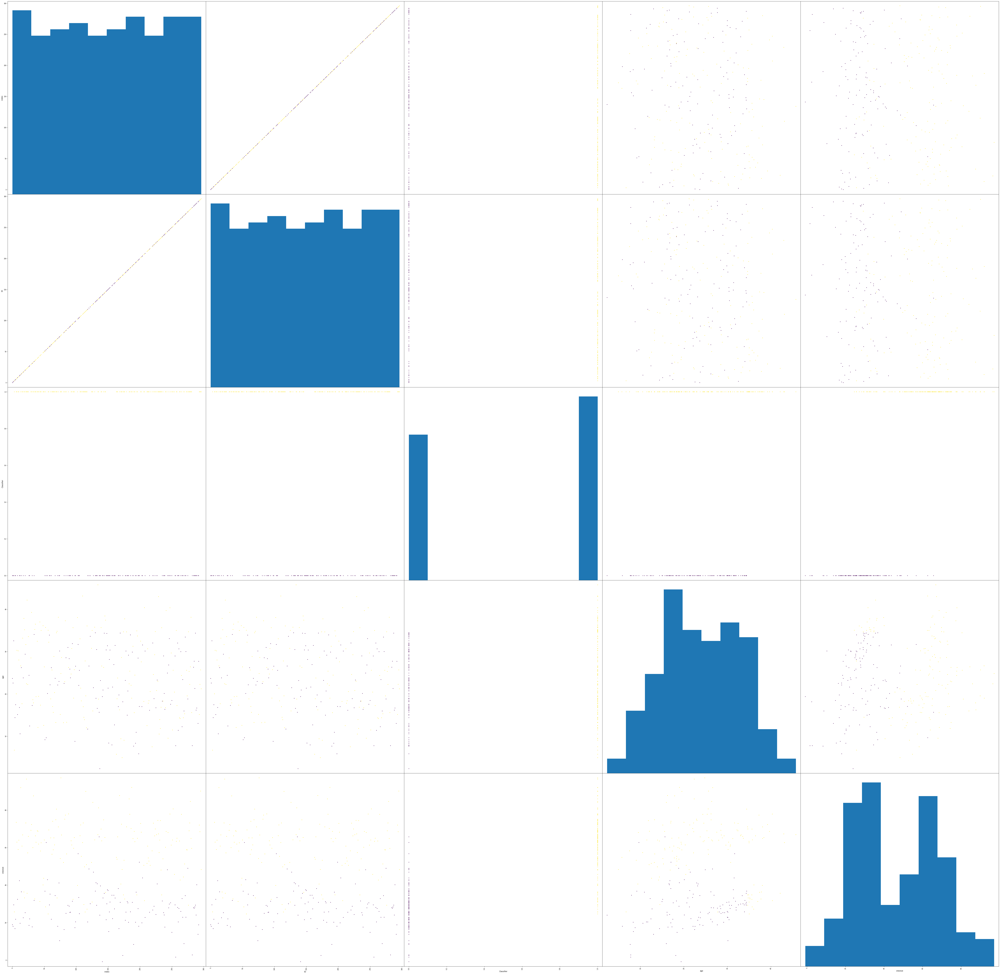

['index' 'ID' 'Classifier' 'age' 'interest']
Name of the extra columns that dont show good seperation of data?(cancel if done removing excess data)cancel
To how many nearest neightbors do you want to trace we reccomend prime numbers?3


0.9666666666666667

In [ ]:
main()